## The following 3 commands are for google colab only

In [1]:
 !unzip data.zip

Archive:  data.zip
   creating: data/
   creating: data/EM_ISBI_Challenge/
  inflating: data/EM_ISBI_Challenge/.DS_Store  
   creating: data/EM_ISBI_Challenge/test_images/
 extracting: data/EM_ISBI_Challenge/test_images/test_01.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_02.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_03.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_04.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_05.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_06.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_07.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_08.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_09.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_10.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_11.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_12.png  
 extracting: data/EM_ISBI_Challenge/test_images/test_13.png  
 extracting: data/EM_I

In [2]:
!pip3 install elasticdeform

In [3]:
!pip3 install PyMaxflow

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure
from scipy.ndimage.morphology import distance_transform_edt
from tqdm import tqdm
import torch
import torch.nn as nn
import pickle
import cv2
import os

## Lets first read the data

In [5]:
data_path = './data/EM_ISBI_Challenge'
train_images_folder ='train_images'
train_labels_folder ='train_labels'
test_images_folder = 'test_images'

# pixels per axis
N = 512

train_images_names = sorted(os.listdir(os.path.join(data_path,train_images_folder)))
train_labels_names = sorted(os.listdir(os.path.join(data_path,train_labels_folder)))
print(train_images_names)
print(train_labels_names)
train_images = np.empty((len(train_images_names)),dtype=object)
train_labels = np.empty((len(train_images_names)),dtype=object)

for i, name in enumerate(train_images_names):
    train_images[i] = cv2.imread(os.path.join(data_path,train_images_folder,name),cv2.IMREAD_GRAYSCALE)
    train_labels[i] = cv2.imread(os.path.join(data_path,train_labels_folder,train_labels_names[i]),cv2.IMREAD_GRAYSCALE)
#     train_labels[i][train_labels[i]==0] = 1
#     train_labels[i][train_labels[i]==255] = 0

['train_01.png', 'train_02.png', 'train_03.png', 'train_04.png', 'train_05.png', 'train_06.png', 'train_07.png', 'train_08.png', 'train_09.png', 'train_10.png', 'train_11.png', 'train_12.png', 'train_13.png', 'train_14.png', 'train_15.png', 'train_16.png', 'train_17.png', 'train_18.png', 'train_19.png', 'train_20.png', 'train_21.png', 'train_22.png', 'train_23.png', 'train_24.png', 'train_25.png', 'train_26.png', 'train_27.png', 'train_28.png', 'train_29.png', 'train_30.png']
['labels_01.png', 'labels_02.png', 'labels_03.png', 'labels_04.png', 'labels_05.png', 'labels_06.png', 'labels_07.png', 'labels_08.png', 'labels_09.png', 'labels_10.png', 'labels_11.png', 'labels_12.png', 'labels_13.png', 'labels_14.png', 'labels_15.png', 'labels_16.png', 'labels_17.png', 'labels_18.png', 'labels_19.png', 'labels_20.png', 'labels_21.png', 'labels_22.png', 'labels_23.png', 'labels_24.png', 'labels_25.png', 'labels_26.png', 'labels_27.png', 'labels_28.png', 'labels_29.png', 'labels_30.png']


## Visualize some of the training examples

In [0]:
def show_img(im, figsize=None, ax=None, alpha=None):
    if not ax: fig,ax = plt.subplots(figsize=figsize)
    ax.imshow(im, alpha=alpha)
    ax.set_axis_off()
    return ax

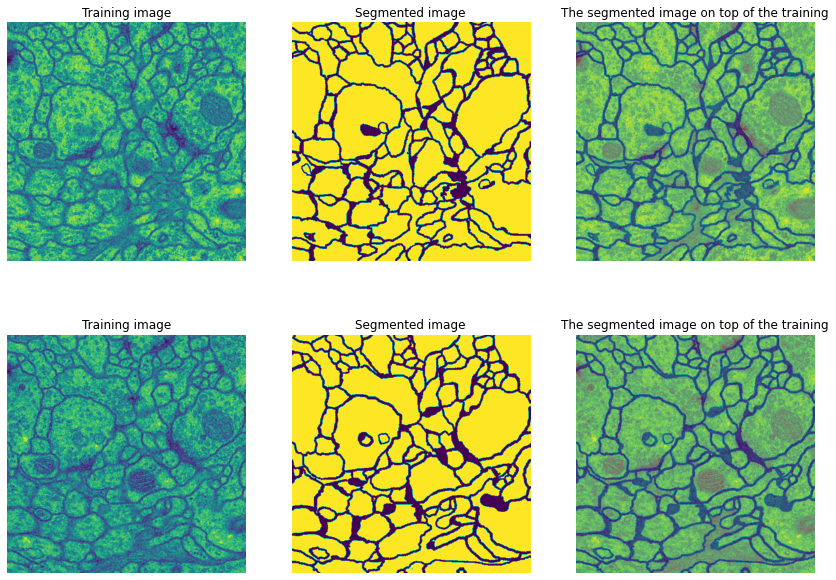

In [7]:
nrows = 2
ncols = 3
fig, axes = plt.subplots(nrows, ncols, figsize=(12, 9))
for row in range(nrows):
    axes[row,0].set_title("Training image")
    axes[row,0] = show_img(train_images[row], ax=axes[row,0])
    axes[row,1].set_title("Segmented image")
    axes[row,1] = show_img(train_labels[row], ax=axes[row,1])
    axes[row,2].set_title("The segmented image on top of the training")
    axes[row,2] = show_img(train_images[row], ax=axes[row,2])
    show_img(train_labels[row], ax=axes[row,2], alpha=0.3)
fig.tight_layout()
plt.show()


## Data augmentation
Since the training data set is very tiny it would be great if we can create some other training examples. Following the recommendations of the original U-net paper we will use elastic deformation.

In [0]:
def plot_4_images(i1,i2,l1,l2):
    nrows = 2
    ncols = 2
    fig, axes = plt.subplots(nrows, ncols, figsize=(12, 9))

    axes[0,0].set_title("Original image")
    axes[0,0] = show_img(i1, ax=axes[0,0])
    axes[0,1].set_title("Augmented image")
    axes[0,1] = show_img(i2, ax=axes[0,1])

    axes[1,0].set_title("Original label")
    axes[1,0] = show_img(l1, ax=axes[1,0])
    axes[1,1].set_title("Augmented label")
    axes[1,1] = show_img(l2, ax=axes[1,1])

    plt.show()

In [9]:
np.unique(train_labels[0])

array([  0, 255], dtype=uint8)

### 1. Elastic deformation

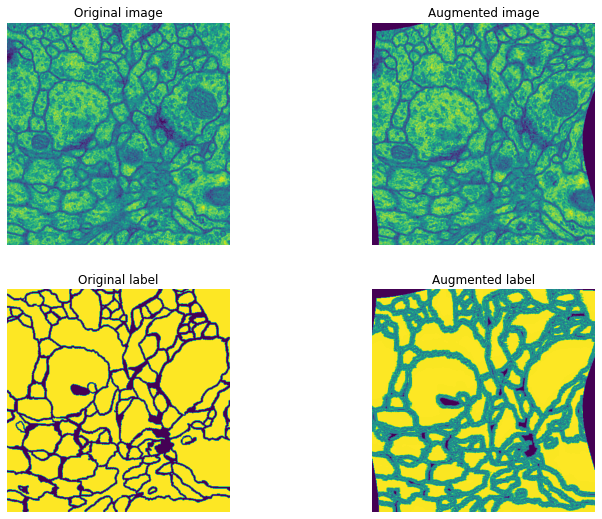

In [10]:
import elasticdeform

[X_deformed, Y_deformed] = elasticdeform.deform_random_grid([train_images[0],train_labels[0]])

plot_4_images(train_images[0],X_deformed,train_labels[0],Y_deformed)

### 2. Flipping (Mirroring)

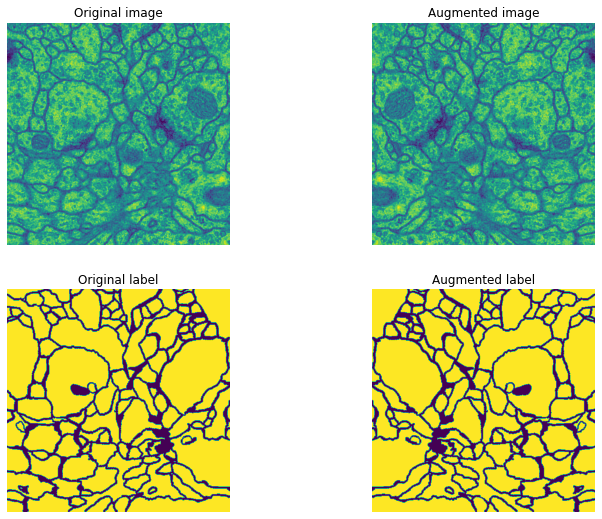

In [11]:
import torchvision.transforms.functional as TF
from PIL import Image


def mirror_horizontal(img):
    image = Image.fromarray(np.uint8(img))
    flipped = TF.hflip(image)
    return np.asarray(flipped)


plot_4_images(train_images[0],mirror_horizontal(train_images[0]),train_labels[0],mirror_horizontal(train_labels[0]))

### 3. Zoom

In [0]:
'''
Source: https://stackoverflow.com/a/48097478/9802962

I decided to improve the method by adding a corner functionality
'''

def cv2_clipped_zoom(img, zoom_factor, corner=None):
    """
    Zoom in/out of the given image and returning an enlarged/shrinked view of 
    the image without changing dimensions
    Args:
        img : Image array
        zoom_factor : amount of zoom as a ratio (0 to Inf)
        corner : if specified it ZOOM IN (WORKS ONLY FOR ZOOM IN) from the corner ["upper_(left/right)","lower_(left/right)"]
            if passed to zoom out (zoom_factor < 1) it will be ignored
    """
    height, width = img.shape[:2] # It's also the final desired shape
    new_height, new_width = int(height * zoom_factor), int(width * zoom_factor)

    ### Crop only the part that will remain in the result (more efficient)
    # Centered bbox of the final desired size in resized (larger/smaller) image coordinates
    y1, x1 = max(0, new_height - height) // 2, max(0, new_width - width) // 2
    y2, x2 = y1 + height, x1 + width
    if(None != corner and "center" != corner):
        if("upper_left" == corner):
            y1 = 0
            x1 = 0
            y2 = height
            x2 = width
        elif("upper_right" == corner):
            y1 = 0
            x1 = max(0, new_width - width)
            y2 = height
            x2 = new_width
        elif("lower_left" == corner):
            y1 = max(0, new_height - height) 
            x1 = 0
            y2 = new_height
            x2 = width
        elif("lower_right" == corner):
            y1 = max(0, new_height - height)
            x1 = max(0, new_width - width)
            y2 = new_height
            x2 = new_width
    
    bbox = np.array([y1,x1,y2,x2])
    # Map back to original image coordinates
    bbox = (bbox / zoom_factor).astype(np.int)
    y1, x1, y2, x2 = bbox
    cropped_img = img[y1:y2, x1:x2]

    # Handle padding when downscaling
    resize_height, resize_width = min(new_height, height), min(new_width, width)
    pad_height1, pad_width1 = (height - resize_height) // 2, (width - resize_width) //2
    pad_height2, pad_width2 = (height - resize_height) - pad_height1, (width - resize_width) - pad_width1
    pad_spec = [(pad_height1, pad_height2), (pad_width1, pad_width2)] + [(0,0)] * (img.ndim - 2)

    result = cv2.resize(cropped_img, (resize_width, resize_height))
    result = np.pad(result, pad_spec, mode='constant')
    assert result.shape[0] == height and result.shape[1] == width
    return result

### 3.1. Center zoom in

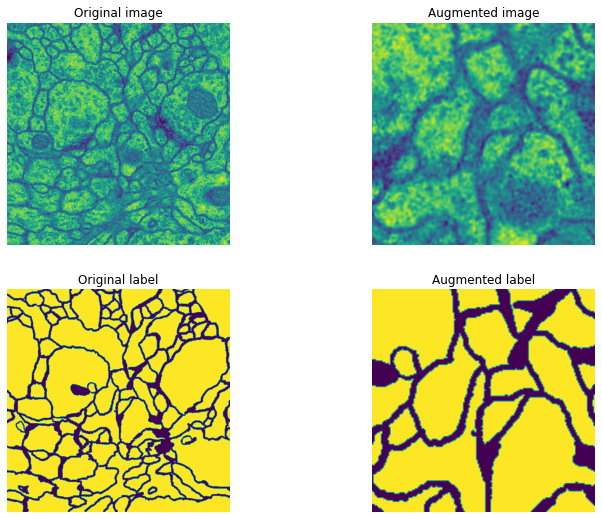

In [13]:
X_deformed = cv2_clipped_zoom(train_images[0],3)
Y_deformed = cv2_clipped_zoom(train_labels[0],3)

plot_4_images(train_images[0],X_deformed,train_labels[0],Y_deformed)

### 3.2. Corner zoom in

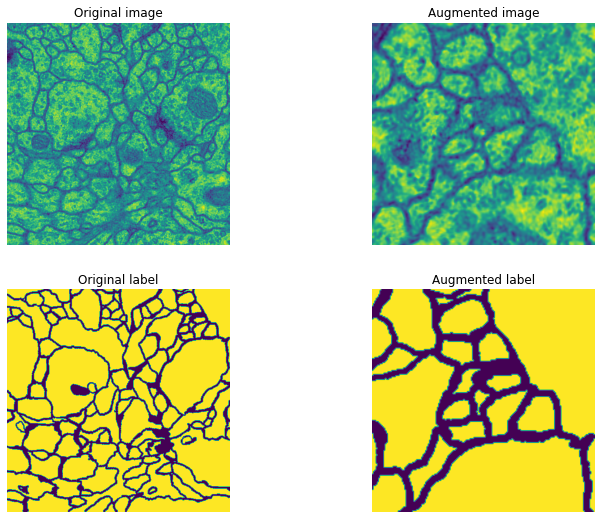

In [14]:
X_deformed = cv2_clipped_zoom(train_images[0],3,"upper_right")
Y_deformed = cv2_clipped_zoom(train_labels[0],3,"upper_right")

plot_4_images(train_images[0],X_deformed,train_labels[0],Y_deformed)

Obviously Elastic deformation does not perform well on the segmented images (the labels) so I decided to enlarge my training dataset by using flipped and zoomed images. However, I found also necessary to run a segmentation algorithm on the results returned from the zooming because noise seems to be introduced. I will pick MRF to fix the augmented label images.

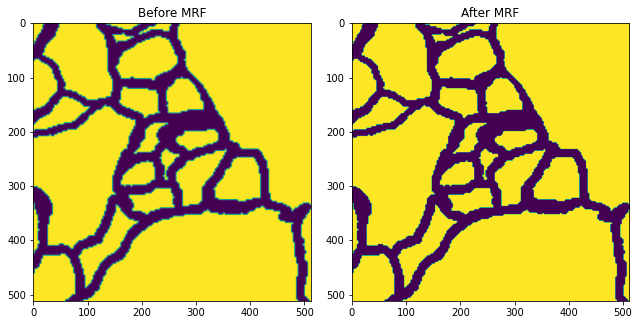

In [110]:
import maxflow

def improve_labels(label, mu = [0,255], beta = 100):
    img_flatten = label.flatten()
    flatten_length = len(img_flatten)
    # Construct the graph
    G = maxflow.Graph[int](flatten_length,flatten_length)
    nodes = G.add_nodes(flatten_length)

    for i in range(flatten_length - 1):
        G.add_edge(nodes[i],nodes[i+1],beta,beta)


    # Set the capacities of the terminal edges.
    for i in range(flatten_length):
        G.add_tedge(nodes[i], (img_flatten[i]-mu[0])**2, (img_flatten[i]-mu[1])**2)

    # Run the max flow algorithm
    flow = G.maxflow()

    seg = np.zeros(img_flatten.shape,dtype=np.uint8)

    for i in range(flatten_length):
        seg[i] = G.get_segment(nodes[i])

    seg = seg.reshape(label.shape)
    # flip the values
    seg[seg==1] = 2
    seg[seg==0] = 255
    seg[seg==2] = 0
    
    return seg

res = improve_labels(Y_deformed)

fig = plt.figure(figsize=(9,4.5))
ax = fig.add_subplot(1,2,1)
im = ax.imshow(Y_deformed)
ax.set_title('Before MRF')

ax = fig.add_subplot(1,2,2)
im = ax.imshow(res)
ax.set_title('After MRF')
fig.tight_layout()
plt.show()


In [0]:
# [X_deformed, Y_deformed] = elasticdeform.deform_random_grid([train_images[0],train_labels[0]])

# # Y_deformed[Y_deformed > 100] =255
# # Y_deformed[Y_deformed < 100] =0

# X_deformed = cv2_clipped_zoom(X_deformed,1.2)
# Y_deformed = cv2_clipped_zoom(Y_deformed,1.2)


# Y_deformed = improve_labels(Y_deformed)

# plot_4_images(cv2_clipped_zoom(train_images[0],1.2),X_deformed,cv2_clipped_zoom(train_labels[0],1.2),Y_deformed)

In [0]:
# import imageio
# imageio.imwrite('segmented_test.jpg', Y_deformed)

In [0]:
# Y_deformed[Y_deformed > 240] =255
# Y_deformed[Y_deformed < 240] =0

In [0]:
# Y_deformed = improve_labels(Y_deformed)
# plot_4_images(cv2_clipped_zoom(train_images[0],1.2),X_deformed,cv2_clipped_zoom(train_labels[0],1.2),Y_deformed)

In [0]:
# ToDo play around with the augmented images
# KNN on the agumneted label

## Creating the dataset

Creating a dataset in pytorch is pretty straightforward we just need to implement an interface defined by <b>Dataset</b> that can be found in torch.utils.data.

In [21]:
# We have

len(train_images)

# images in our train set I decided to expand the train set up to 90

30

Lets add all the transformations into a single array

In [0]:
import random

def zoom_transformation(img, label):
    corner_options = ["center","upper_left","upper_right","lower_left","lower_right"]
    zoom_factor = np.random.uniform(1,4)
    
    random_corner_option = random.choice(corner_options)
    zoomed_img = cv2_clipped_zoom(img,zoom_factor,random_corner_option)
    zoomed_label = cv2_clipped_zoom(label,zoom_factor,random_corner_option)
    
    zoomed_label = improve_labels(zoomed_label)
    
    return (zoomed_img,zoomed_label)
    

I prefer to apply the augmentation before actually passing it to the Dataset class

<b>THIS TAKES TIME</b>

In [0]:
imgs = None
labels = None

training_imgs_file_name = "training_imgs.pkl"
training_labels_file_name = "training_labels.pkl"

if (os.path.isfile(os.path.join(data_path,training_imgs_file_name)) and os.path.isfile(os.path.join(data_path,training_labels_file_name))):
    infile = open(os.path.join(data_path,training_imgs_file_name),'rb')
    imgs = pickle.load(infile)
    infile.close()
    infile = open(os.path.join(data_path,training_labels_file_name),'rb')
    labels = pickle.load(infile)
    infile.close()
else:

    p_apply = 0.6

    augmented_length = 2* len(train_images)
    augmented_images = np.empty((augmented_length),dtype=object)
    augmented_labels = np.empty((augmented_length),dtype=object)
    index = 0
    
    

    print("Zooming augmentation:")
    pbar = tqdm(total=augmented_length)
    # First we zoom some of the images
    while(index < augmented_length):
        # we take a random index of X
        random_index = np.random.randint(len(train_images))

        zoomed_img, zoomed_label = zoom_transformation(train_images[random_index],train_labels[random_index])

        # we choose whether to apply it with P(apply) = p_apply
        choose = np.random.uniform()
        if(choose > (1-p_apply)):
            augmented_images[index] = zoomed_img
            augmented_labels[index] = zoomed_label
            index += 1
            pbar.update(1)
    pbar.close()

    print("Zooming augmentation ready")

    # we concatenate both data sets
    imgs = np.concatenate([train_images,augmented_images],axis = 0)
    labels = np.concatenate([train_labels,augmented_labels],axis = 0)

    # apply mirroring of some of them        
    mirrored_imgs = np.empty((int(len(train_images)/2)),dtype=object)
    mirrored_labels = np.empty((int(len(train_labels)/2)),dtype=object)
    
    
    print("Mirroring augmentation:")
    pbar = tqdm(total=len(mirrored_imgs))
    index = 0
    while(index < len(mirrored_imgs)):
        random_index = np.random.randint(len(imgs))

        choose = np.random.uniform()
        if(choose > (1-p_apply)):
            mirrored_imgs[index] = mirror_horizontal(imgs[random_index])
            mirrored_labels[index] = mirror_horizontal(labels[random_index])
            index += 1
            pbar.update(1)
    pbar.close()
    print("Mirroring augmentation ready")

    imgs = np.concatenate([imgs,mirrored_imgs],axis = 0)
    labels = np.concatenate([labels,mirrored_labels],axis = 0)

    # lets now shuffle the elements
    number_list = np.arange(len(imgs))
    np.random.shuffle(number_list)
    imgs = imgs[number_list]
    labels = labels[number_list]

    # serialize the data
    pickle.dump(imgs, open(os.path.join(data_path,training_imgs_file_name), 'wb')) 
    pickle.dump(labels, open(os.path.join(data_path,training_labels_file_name), 'wb')) 


In [24]:
len(labels)

105

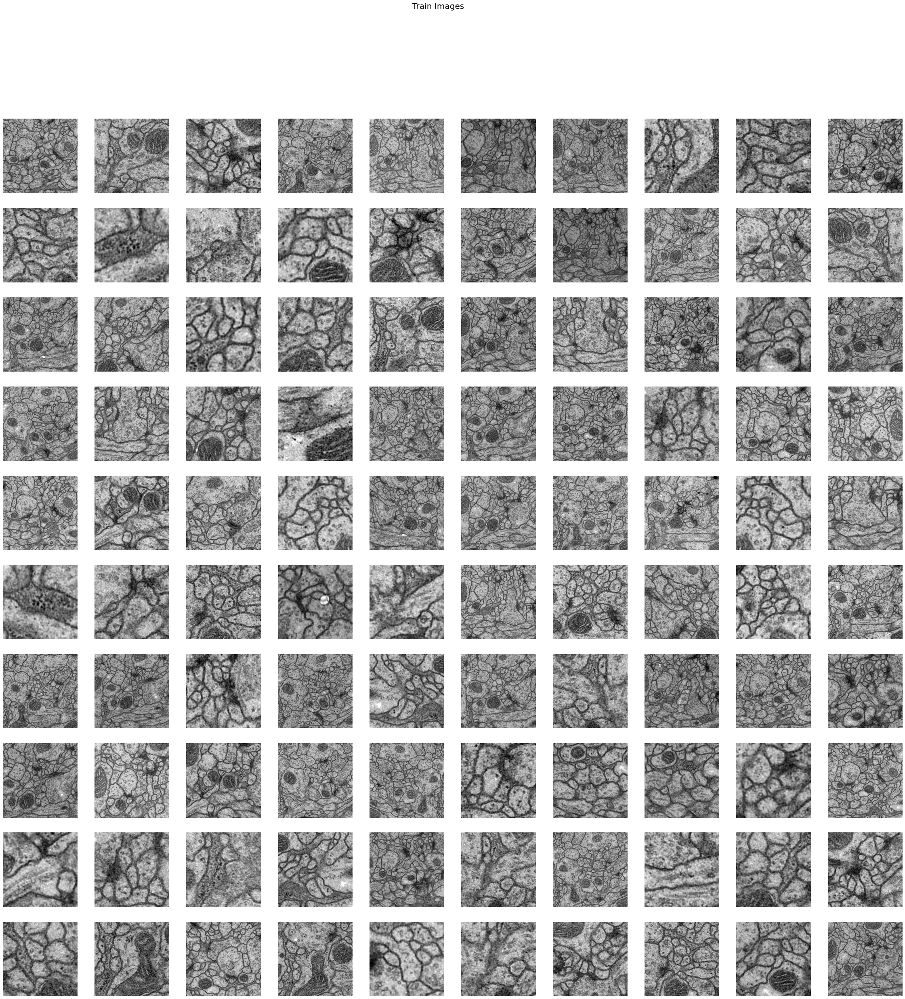

In [25]:
# Lets plot some of the resulted images
fig, ax = plt.subplots(nrows=10, ncols=10,figsize=(40,40))
fig.suptitle('Train Images', fontsize=20)
idx = 0
for row in ax:
    for col in row:
        image = imgs[idx]
        col.imshow(image, cmap='gray')
        col.axis('off')
        idx+=1
        if(99 == idx):
            col.set_axis_off()
plt.show()

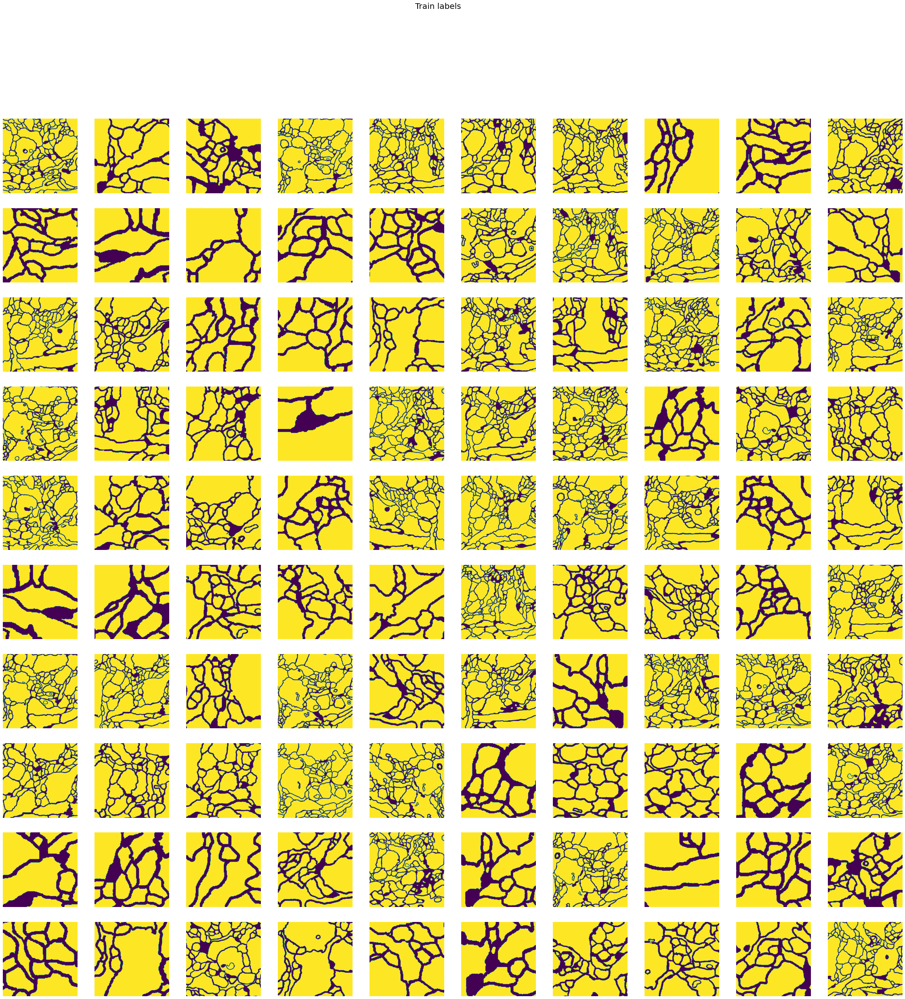

In [26]:
fig, ax = plt.subplots(nrows=10, ncols=10,figsize=(40,40))
fig.suptitle('Train labels', fontsize=20)
idx = 0
for row in ax:
    for col in row:
        image = labels[idx]
        col.imshow(image)
        col.axis('off')
        idx+=1
        if 104 == idx:
            col.set_axis_off()
        
plt.show()

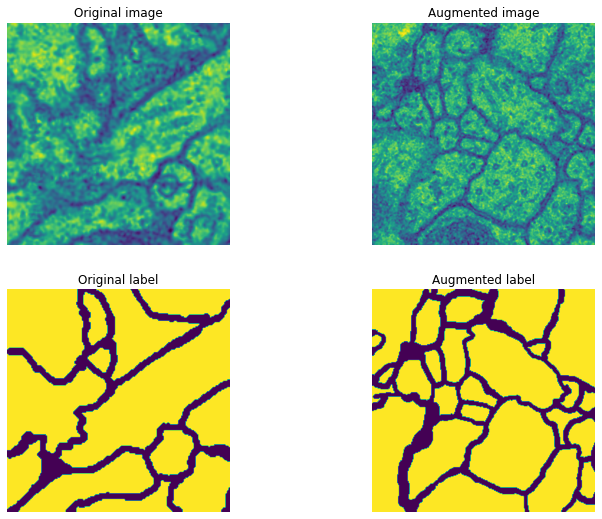

In [27]:
# lets better see if the images match with the labels
plot_4_images(imgs[54],imgs[102],labels[54],labels[102])

In [0]:
from torch.utils.data import Dataset

class NeuronalData(Dataset):
    def __init__(self, X, y,w_map):
        self.imgs = torch.from_numpy(X)
        self.labels = torch.from_numpy(y)
        self.weight_maps = torch.from_numpy(w_map)
        
    def __len__(self):
        return len(self.imgs)
    
    def __getitem__(self, index):
        return (self.imgs[index],self.labels[index],self.weight_maps[index])

## Defining the network architecture

In [0]:
class Unet(nn.Module):
    def __init__(self):
        super().__init__()
        # ENCODING part
        
        # 64x512x512
        self.enc_conv_1 = nn.Sequential(
            nn.Conv2d(in_channels=1,out_channels=64,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64,out_channels=64,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
        )
        
        # 64x256x256
        self.max_pool = nn.MaxPool2d(2, 2)  
        
        # 128x256x256
        self.enc_conv_2 = nn.Sequential(
            nn.Conv2d(in_channels=64,out_channels=128,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128,out_channels=128,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )
        
        # 128x128x128
        # max pool here as well
        
        # 256x128x128
        self.enc_conv_3 = nn.Sequential(
            nn.Conv2d(in_channels=128,out_channels=256,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256,out_channels=256,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        # 256x64x64
        # max pool here as well
        
        # 512x64x64
        self.enc_conv_4 = nn.Sequential(
            nn.Conv2d(in_channels=256,out_channels=512,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512,out_channels=512,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
        )
        
        # 512x32x32
        # max pool here as well
        
        # 1024x32x32
        self.bottom_layer =  nn.Sequential(
            nn.Conv2d(in_channels=512,out_channels=1024,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
            nn.Conv2d(in_channels=1024,out_channels=1024,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(),
        )
        
        # DECODING part
        
        # 512x64x64
        self.dec_deconv1 = nn.ConvTranspose2d(in_channels=1024,out_channels=512,kernel_size=2,stride=2,padding=0)
        
        # input 1024 ( concatenated de and encoding parts) x64x64, output  512x64x64
        self.dec_conv_1 = nn.Sequential(
            nn.Conv2d(in_channels=1024,out_channels=512,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(in_channels=512,out_channels=512,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
        )
        
        # 256x128x128
        self.dec_deconv2 = nn.ConvTranspose2d(in_channels=512,out_channels=256,kernel_size=2,stride=2,padding=0)
        
        # input 512 ( concatenated de and encoding parts) x128x128, output  256x128x128
        self.dec_conv_2 = nn.Sequential(
            nn.Conv2d(in_channels=512,out_channels=256,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(in_channels=256,out_channels=256,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        # 128x256x256
        self.dec_deconv3 = nn.ConvTranspose2d(in_channels=256,out_channels=128,kernel_size=2,stride=2,padding=0)
        
        # input 256 ( concatenated de and encoding parts) x256x256, output  128x256x256
        self.dec_conv_3 = nn.Sequential(
            nn.Conv2d(in_channels=256,out_channels=128,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(in_channels=128,out_channels=128,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
        )
        
        # 64x512x512
        self.dec_deconv4 = nn.ConvTranspose2d(in_channels=128,out_channels=64,kernel_size=2,stride=2,padding=0)
        
        # input 128 ( concatenated de and encoding parts) x512x512, output  1x512x512
        self.dec_conv_4 = nn.Sequential(
            nn.Conv2d(in_channels=128,out_channels=64,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64,out_channels=64,kernel_size=3,stride=1,padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(in_channels=64,out_channels=1,kernel_size=1,stride=1,padding=0),
            nn.Sigmoid(),
        )
        
    def forward(self, X):
        # encoding part
        en_64 = self.enc_conv_1(X)
        en_128 = self.enc_conv_2(self.max_pool(en_64))
        en_256 = self.enc_conv_3(self.max_pool(en_128))
        en_512 = self.enc_conv_4(self.max_pool(en_256))
        bottom = self.bottom_layer(self.max_pool(en_512))
        
        #bottom should be 1024x32x32
        
        # decoding part
        upimg = self.dec_deconv1(bottom)
        upimg = self.dec_conv_1(torch.cat([en_512,upimg],1))
        upimg = self.dec_deconv2(upimg)
        upimg = self.dec_conv_2(torch.cat([en_256,upimg],1))
        upimg = self.dec_deconv3(upimg)
        upimg = self.dec_conv_3(torch.cat([en_128,upimg],1))
        upimg = self.dec_deconv4(upimg)
        upimg = self.dec_conv_4(torch.cat([en_64,upimg],1))
        
        return upimg

### Utils

In [0]:
# Courtesy to Rok Mihevc, https://gist.github.com/rok/5f4314ed3c294521456c6afda36a3a50
def unet_weight_map(y, wc=None, w0 = 10, sigma = 5):

    """
    Generate weight maps as specified in the U-Net paper
    for boolean mask.
    
    "U-Net: Convolutional Networks for Biomedical Image Segmentation"
    https://arxiv.org/pdf/1505.04597.pdf
    
    Parameters
    ----------
    mask: Numpy array
        2D array of shape (image_height, image_width) representing binary mask
        of objects.
    wc: dict
        Dictionary of weight classes.
    w0: int
        Border weight parameter.
    sigma: int
        Border width parameter.

    Returns
    -------
    Numpy array
        Training weights. A 2D array of shape (image_height, image_width).
    """
    
    labels = measure.label(y)
    no_labels = labels == 0
    label_ids = sorted(np.unique(labels))[1:]

    if len(label_ids) > 1:
        distances = np.zeros((y.shape[0], y.shape[1], len(label_ids)))

        for i, label_id in enumerate(label_ids):
            distances[:,:,i] = distance_transform_edt(labels != label_id)

        distances = np.sort(distances, axis=2)
        d1 = distances[:,:,0]
        d2 = distances[:,:,1]
        w = w0 * np.exp(-1/2*((d1 + d2) / sigma)**2) * no_labels
        
        if wc:
            class_weights = np.zeros_like(y)
            for k, v in wc.items():
                class_weights[y == k] = v
            w = w + class_weights
    else:
        w = np.zeros_like(y)
    
    return w

## Training

In [0]:
# Use GPU for images! Especially that size
cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if cuda else "cpu")

In [32]:
cuda

True

In [0]:
imgs1 = np.array(list(imgs),dtype=np.float)

In [0]:
labels1 = np.array(list(labels),dtype=np.float)

In [0]:
imgs1 = imgs1/255
labels1 = labels1/255

In [36]:
labels1[1,0,0]

1.0

##### Create weight maps for each label, they are used in the loss function

In [94]:
weight_maps = []
for l in tqdm(labels1):
    weight_maps.append(unet_weight_map(l,{
        0: 1, # background (been 1
        1: 3  # objects (been 5
    }))


100%|██████████| 105/105 [02:19<00:00,  1.32s/it]


In [0]:
weight_maps = np.array(weight_maps,dtype=np.float)

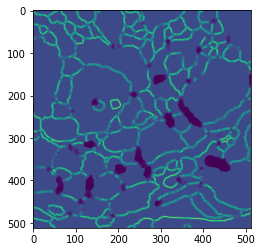

In [96]:
plt.imshow(weight_maps[0])
plt.show()

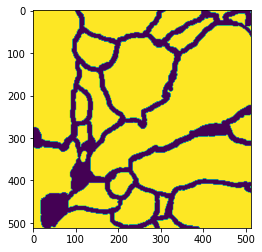

In [97]:
plt.imshow(labels[1])
plt.show()

In [98]:
labels[1][0,0]

255

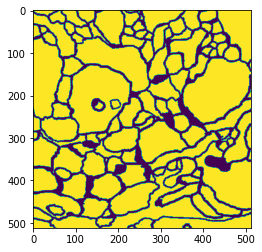

In [99]:
t = labels1[0]*weight_maps[0]
plt.imshow(t)
plt.show()

In [0]:
train_img_set = imgs1[:int(len(imgs1)*0.9)]
train_label_set = labels1[:int(len(labels1)*0.9)]
train_w_map = weight_maps[:int(len(labels1)*0.9)]

test_img_set = imgs1[int(len(imgs1)*0.9):]
test_label_set = labels1[int(len(labels1)*0.9):]
test_w_map = weight_maps[int(len(labels1)*0.9):]

In [101]:
np.unique(labels1[0])

array([0., 1.])

# Implement CV so I can test the images here

In [0]:
num_epochs = 80
batch_size = 2

In [122]:
from torch.utils.data import DataLoader

train_data = NeuronalData(train_img_set,train_label_set,train_w_map)

# implement the loss function from the paper
def loss_fn(y_real,y_pred):
    return torch.mean(y_pred - y_real*y_pred + torch.log(1 + torch.exp(-y_pred)))


net = Unet()
net = net.to(device)


# loss = loss_fn
train_loader = DataLoader(train_data,batch_size)
optimizer = torch.optim.Adam(net.parameters(),lr=1e-4)


test_img = torch.from_numpy(test_img_set)
test_img = test_img.resize_((test_img.shape[0],1,test_img.shape[1],test_img.shape[2]))
test_img = test_img.to(device,dtype=torch.float)

test_label = torch.from_numpy(test_label_set)
test_label = test_label.resize_((test_label.shape[0],1,test_label.shape[1],test_label.shape[2]))
test_label = test_label.to(device,dtype=torch.float)

test_w = torch.from_numpy(test_w_map)
test_w = test_w.resize_((test_w.shape[0],1,test_w.shape[1],test_w.shape[2]))
test_w = test_w.to(device,dtype=torch.float)

# test_loss = nn.BCELoss(test_w)
test_loss = nn.BCELoss()


for epoch in range(num_epochs):
    print("Epoch: ",epoch)
    # pbar = tqdm(total=len(train_loader))
    avg_loss = 0
    # Forward -> Backprob -> Update params
    for i , data in enumerate(tqdm(train_loader)):        
        X,y,w = data
        X = X.resize_((X.shape[0],1,X.shape[1],X.shape[2]))
        y = y.resize_((y.shape[0],1,y.shape[1],y.shape[2]))
        w = y.resize_((w.shape[0],1,w.shape[1],w.shape[2]))
        
        # move to GPU
        X = X.to(device,dtype=torch.float)
        y = y.to(device,dtype=torch.float)
        w = w.to(device,dtype=torch.float)
        
        optimizer.zero_grad()
        
        Y_guess = net(X)
        # loss = nn.BCELoss(weight=w)
        loss = nn.BCELoss()

        output = loss(Y_guess,y)
        output.backward()
        optimizer.step()       
        avg_loss += output/len(train_loader)
        
    with torch.no_grad():
      test_predict = net(test_img)
      t_loss = test_loss(test_predict,test_label)
      print("Test loss: ",t_loss)
    print("\nTrain loss: ",avg_loss)
    

  2%|▏         | 1/47 [00:00<00:05,  8.63it/s]

Epoch:  0


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.4480, device='cuda:0')

Train loss:  tensor(0.5724, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  1


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3946, device='cuda:0')

Train loss:  tensor(0.4300, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  2


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3691, device='cuda:0')

Train loss:  tensor(0.3837, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  3


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3488, device='cuda:0')

Train loss:  tensor(0.3569, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  4


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3369, device='cuda:0')

Train loss:  tensor(0.3360, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  5


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3207, device='cuda:0')

Train loss:  tensor(0.3192, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  6


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3119, device='cuda:0')

Train loss:  tensor(0.3039, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  7


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3161, device='cuda:0')

Train loss:  tensor(0.2882, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  8


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2860, device='cuda:0')

Train loss:  tensor(0.2801, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  9


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2780, device='cuda:0')

Train loss:  tensor(0.2635, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  10


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2767, device='cuda:0')

Train loss:  tensor(0.2508, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  11


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2739, device='cuda:0')

Train loss:  tensor(0.2458, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  12


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2638, device='cuda:0')

Train loss:  tensor(0.2335, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  13


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2745, device='cuda:0')

Train loss:  tensor(0.2259, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  14


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2601, device='cuda:0')

Train loss:  tensor(0.2215, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  15


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2648, device='cuda:0')

Train loss:  tensor(0.2104, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  16


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2457, device='cuda:0')

Train loss:  tensor(0.2042, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  17


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2435, device='cuda:0')

Train loss:  tensor(0.1938, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  18


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2578, device='cuda:0')

Train loss:  tensor(0.1856, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  19


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2649, device='cuda:0')

Train loss:  tensor(0.1782, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  20


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2539, device='cuda:0')

Train loss:  tensor(0.1784, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  21


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2619, device='cuda:0')

Train loss:  tensor(0.1729, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  22


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2503, device='cuda:0')

Train loss:  tensor(0.1691, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  23


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2542, device='cuda:0')

Train loss:  tensor(0.1640, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  24


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2590, device='cuda:0')

Train loss:  tensor(0.1583, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  25


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2734, device='cuda:0')

Train loss:  tensor(0.1513, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  26


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2656, device='cuda:0')

Train loss:  tensor(0.1479, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  27


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2885, device='cuda:0')

Train loss:  tensor(0.1410, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  28


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2747, device='cuda:0')

Train loss:  tensor(0.1373, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  29


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2449, device='cuda:0')

Train loss:  tensor(0.1418, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  30


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2408, device='cuda:0')

Train loss:  tensor(0.1375, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  31


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2491, device='cuda:0')

Train loss:  tensor(0.1277, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  32


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2540, device='cuda:0')

Train loss:  tensor(0.1241, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  33


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2604, device='cuda:0')

Train loss:  tensor(0.1226, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  34


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2654, device='cuda:0')

Train loss:  tensor(0.1191, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  35


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2553, device='cuda:0')

Train loss:  tensor(0.1155, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  36


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2501, device='cuda:0')

Train loss:  tensor(0.1128, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  37


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2640, device='cuda:0')

Train loss:  tensor(0.1109, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  38


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2688, device='cuda:0')

Train loss:  tensor(0.1113, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  39


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2620, device='cuda:0')

Train loss:  tensor(0.1063, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  40


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2530, device='cuda:0')

Train loss:  tensor(0.0995, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  41


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2650, device='cuda:0')

Train loss:  tensor(0.0967, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  42


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2665, device='cuda:0')

Train loss:  tensor(0.0947, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  43


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2659, device='cuda:0')

Train loss:  tensor(0.0933, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  44


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2698, device='cuda:0')

Train loss:  tensor(0.0975, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  45


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2528, device='cuda:0')

Train loss:  tensor(0.0956, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  46


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2746, device='cuda:0')

Train loss:  tensor(0.0935, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  47


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2893, device='cuda:0')

Train loss:  tensor(0.0887, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  48


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2777, device='cuda:0')

Train loss:  tensor(0.0881, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  49


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2936, device='cuda:0')

Train loss:  tensor(0.0809, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  50


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2883, device='cuda:0')

Train loss:  tensor(0.0786, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  51


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3060, device='cuda:0')

Train loss:  tensor(0.0783, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  52


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3096, device='cuda:0')

Train loss:  tensor(0.0769, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  53


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3213, device='cuda:0')

Train loss:  tensor(0.0788, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  54


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3162, device='cuda:0')

Train loss:  tensor(0.0756, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  55


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3009, device='cuda:0')

Train loss:  tensor(0.0748, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  56


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3217, device='cuda:0')

Train loss:  tensor(0.0736, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  57


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2935, device='cuda:0')

Train loss:  tensor(0.0745, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  58


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2966, device='cuda:0')

Train loss:  tensor(0.0675, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  59


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3140, device='cuda:0')

Train loss:  tensor(0.0642, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  60


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3112, device='cuda:0')

Train loss:  tensor(0.0659, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  61


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3092, device='cuda:0')

Train loss:  tensor(0.0696, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  62


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3106, device='cuda:0')

Train loss:  tensor(0.0705, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  63


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3470, device='cuda:0')

Train loss:  tensor(0.0685, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  64


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3709, device='cuda:0')

Train loss:  tensor(0.0760, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  65


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2801, device='cuda:0')

Train loss:  tensor(0.1049, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  66


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.2958, device='cuda:0')

Train loss:  tensor(0.0692, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  67


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3190, device='cuda:0')

Train loss:  tensor(0.0612, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  68


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3267, device='cuda:0')

Train loss:  tensor(0.0612, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  69


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3389, device='cuda:0')

Train loss:  tensor(0.0642, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  70


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3362, device='cuda:0')

Train loss:  tensor(0.0669, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  71


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3149, device='cuda:0')

Train loss:  tensor(0.0644, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  72


100%|██████████| 47/47 [00:11<00:00,  3.94it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3122, device='cuda:0')

Train loss:  tensor(0.0631, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  73


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3209, device='cuda:0')

Train loss:  tensor(0.0615, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  74


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3300, device='cuda:0')

Train loss:  tensor(0.0589, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  75


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3566, device='cuda:0')

Train loss:  tensor(0.0572, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  76


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3459, device='cuda:0')

Train loss:  tensor(0.0570, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  77


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3343, device='cuda:0')

Train loss:  tensor(0.0560, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  78


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  

  0%|          | 0/47 [00:00<?, ?it/s]

tensor(0.3489, device='cuda:0')

Train loss:  tensor(0.0533, device='cuda:0', grad_fn=<AddBackward0>)
Epoch:  79


100%|██████████| 47/47 [00:11<00:00,  3.93it/s]


Test loss:  tensor(0.3639, device='cuda:0')

Train loss:  tensor(0.0502, device='cuda:0', grad_fn=<AddBackward0>)


In [50]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
torch.save(net.state_dict(), '/content/drive/My Drive/unet_model/model_GoodResult.pth')

100%|██████████| 11/11 [00:00<00:00, 15.36it/s]


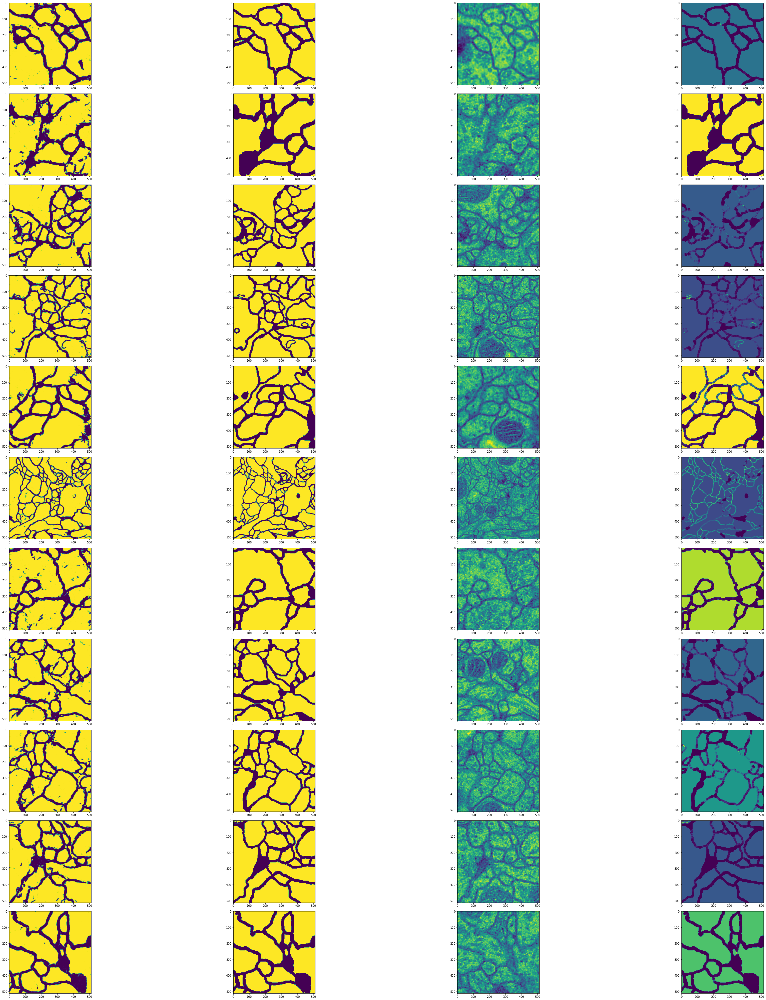

In [144]:
f, axarr = plt.subplots(len(test_img),4,figsize=(50,50))
for index in tqdm(range(len(test_img))):
  test = test_img[index]
  test = test.resize_((1,1,512,512))
  guess = net(test)
  g = guess.cpu().detach().numpy()
  g = g.reshape((512,512))
  axarr[index,0].imshow(g)
  axarr[index,1].imshow(test_label_set[index])
  axarr[index,2].imshow(test_img_set[index])
  axarr[index,3].imshow(test_w_map[index])

plt.tight_layout()
plt.savefig('alltests.png')
plt.show()

In [0]:
a = test_w_map[index]/np.max(test_w_map[index])

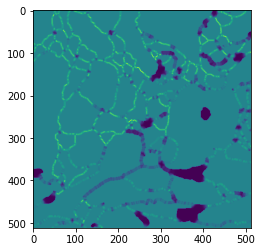

In [61]:
plt.imshow(a)
plt.show()

In [106]:
import imageio
imageio.imwrite('test.jpg', g)

In [107]:
print(g[0,0])
test = np.array(g)
test[test>0.8] = 1
test[test!=1] = 0
print(test[0,0])

0.96854925
1.0


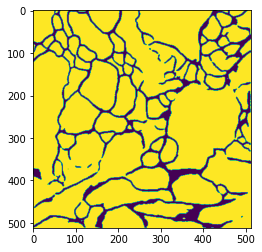

In [108]:
plt.imshow(test)
plt.show()

In [0]:
test_images_names = sorted(os.listdir(os.path.join(data_path,test_images_folder)))
test_labels = []

for i, name in enumerate(test_images_names):
    test_labels.append(cv2.imread(os.path.join(data_path,test_images_folder,name),cv2.IMREAD_GRAYSCALE))

test = np.array(test_labels)

In [0]:
plt.imshow(test[0])
plt.show()

In [0]:
test_image = test[0]/255

In [0]:
test_img = torch.from_numpy(test_image)
test_img = test_img.resize_((1,1,test_img.shape[0],test_img.shape[1]))
test_img = test_img.to(device,dtype=torch.float)